In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd

import warnings
warnings.filterwarnings("ignore")

In [2]:
%run ./module_P2_utils.ipynb

In [3]:
# df = pd.read_csv("./tmp/df_03_quali.csv")
df = pd.read_pickle("./tmp/df_03_quali.gzip")

Correlation btw 'nutriscore_score' and 'additives_n'

'contingency table'


***

# Analysis focused on Quantitative features

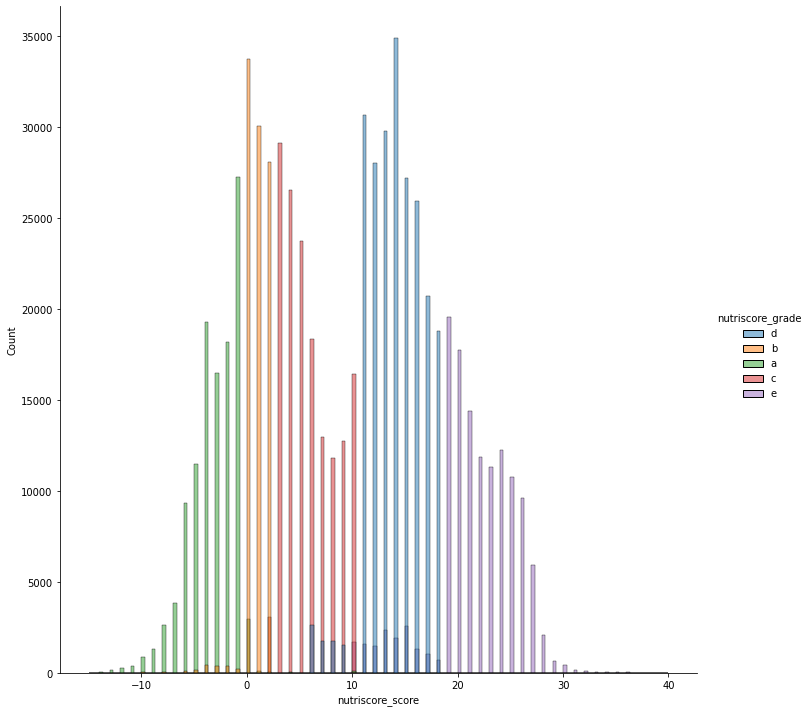

In [4]:
sns.displot(data=df, hue='nutriscore_grade', x='nutriscore_score', height=10)

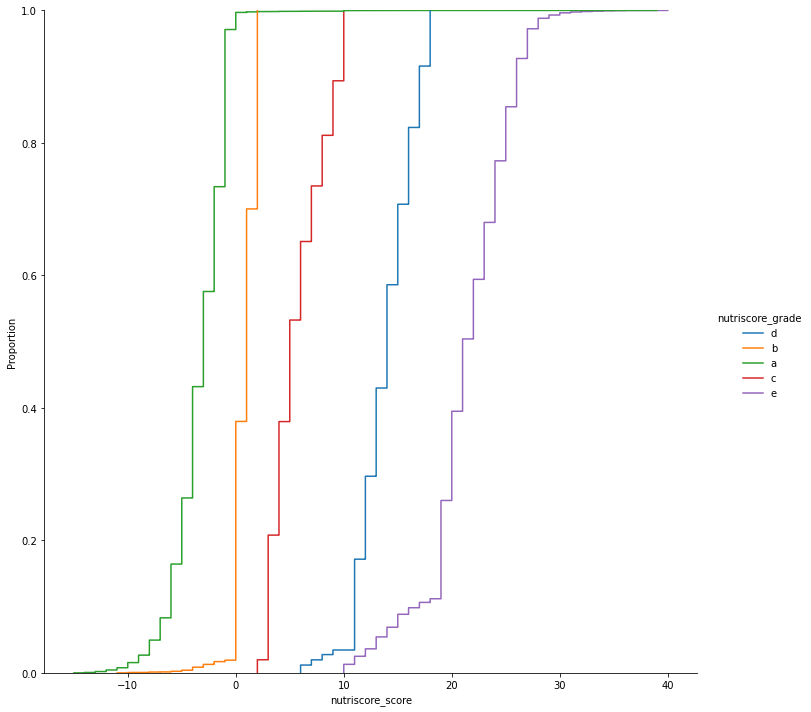

In [5]:
sns.displot(data=df, hue='nutriscore_grade', x='nutriscore_score',kind='ecdf', height=10)

We can see nutriscore grade and score may be correlated, but some values are overlapping, so we may expect it difficult to make any projections thanks to it.

### Correlations between features

Let's use the Pearson Correlation coefficient for our analysis of correlation

For convenience and further analysis, we use absolute values.

In [6]:
correlations = df.select_dtypes('float').corr(method="pearson")
correlations = np.abs(correlations)
correlations

,additives_n,nutriscore_score,energy-kcal_100g,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g
additives_n,1.000000,0.190463,0.071431,0.093514,0.072095,0.136920,0.178192,0.161574,0.019512,0.111632,0.111617,0.295182
nutriscore_score,0.190463,1.000000,0.514698,0.578317,0.665420,0.613793,0.242434,0.182480,0.039898,0.284028,0.284035,1.000000
energy-kcal_100g,0.071431,0.514698,1.000000,0.967918,0.704853,0.561154,0.530614,0.229329,0.397283,0.266112,0.266121,0.366877
energy_100g,0.093514,0.578317,0.967918,1.000000,0.731808,0.575507,0.567980,0.249249,0.426725,0.287250,0.287248,0.401920
fat_100g,0.072095,0.665420,0.704853,0.731808,1.000000,0.751979,0.197373,0.158031,0.466066,0.410888,0.410883,0.448844
saturated-fat_100g,0.136920,0.613793,0.561154,0.575507,0.751979,1.000000,0.148300,0.245602,0.396218,0.350177,0.350170,0.429570
carbohydrates_100g,0.178192,0.242434,0.530614,0.567980,0.197373,0.148300,1.000000,0.433564,0.095892,0.046727,0.046714,0.206927
sugars_100g,0.161574,0.182480,0.229329,0.249249,0.158031,0.245602,0.433564,1.000000,0.000709,0.008917,0.008917,0.191569
proteins_100g,0.019512,0.039898,0.397283,0.426725,0.466066,0.396218,0.095892,0.000709,1.000000,0.490700,0.490705,0.147951
salt_100g,0.111632,0.284028,0.266112,0.287250,0.410888,0.350177,0.046727,0.008917,0.490700,1.000000,0.999988,0.280558


<AxesSubplot:>

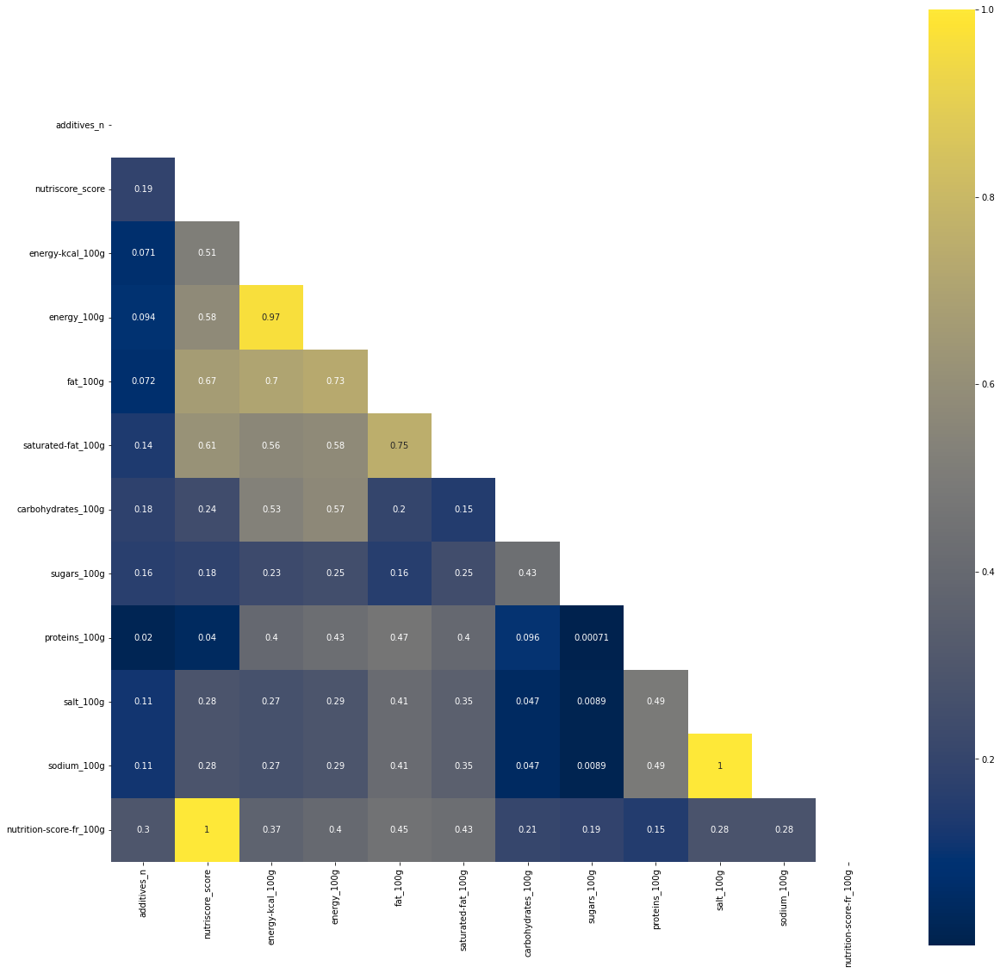

In [7]:
mask = np.zeros_like(correlations)
mask[np.triu_indices_from(mask)] = True
sns.axes_style("white")
plt.subplots(figsize=(20,20))
sns.heatmap(correlations, mask=mask, vmax=1, square=True, xticklabels=correlations.columns, yticklabels=correlations.columns, annot=True, cmap='cividis')

We consider a good correlation if corr > 0.5, and a pretty good correlation if corr > 0.3.

We can see that most correlated values are
* energy and energy-kcal
* nutriscore_score and nutriscore-score-fr
* sodium and salt

which was indeed predictable and doesn't teach us something

But, interestingly, we can see that nutriscore is well correlated with:
* saturated_fat
* fat
* energy
* energy_kcal
* nova_group

Also we can see some of the nutriments are correlated each others. By extension we may find out that nutriscore is a combination of all those nutriments.



<Figure size 1440x3600 with 0 Axes>

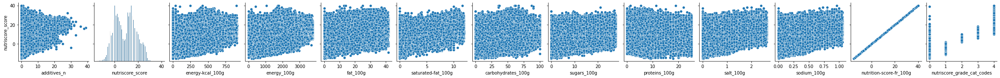

In [68]:
plt.figure(figsize=(20, 50))
sns.pairplot(df, y_vars=['nutriscore_score'], x_vars=df.select_dtypes('float') )

***

In [8]:
pd.crosstab(df['nutriscore_grade'], df['pnns_groups_1'] )

pnns_groups_1,Alcoholic beverages,Beverages,Cereals and potatoes,Composite foods,Fat and sauces,Fish Meat Eggs,Fruits and vegetables,Milk and dairy products,Salty snacks,Sugary snacks,unknown
nutriscore_grade,,,,,,,,,,,
a,1,4472,31515,6948,2695,12563,31083,9058,1750,1216,13582
b,1,8780,14229,13802,4166,12321,5237,14663,2427,2595,15439
c,10,9710,15029,16982,21122,17372,7256,16224,8723,12859,29400
d,21,7383,11844,12244,18644,29238,1046,39221,12268,49794,41966
e,11,15097,2211,1574,9704,16569,114,5011,5301,57864,18470


<AxesSubplot:title={'center':'mean nutriscore for pnns_group and nutriscore_grade'}, xlabel='nutriscore_grade', ylabel='pnns_groups_1'>

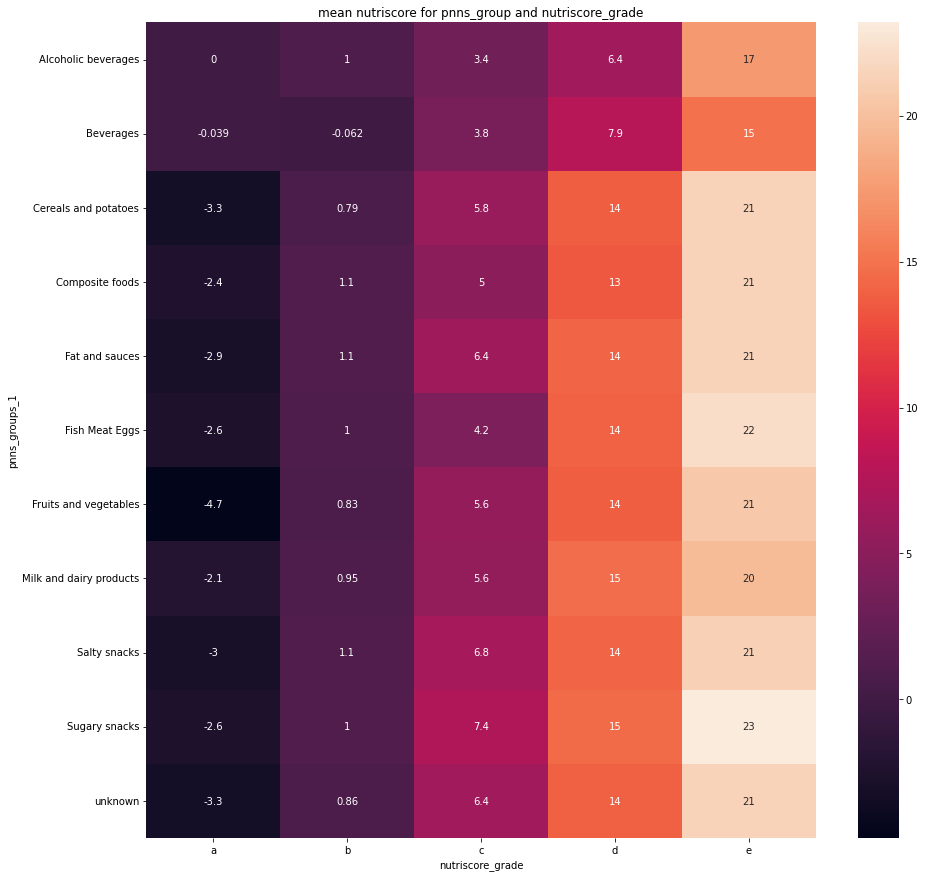

In [9]:
# df.drop(['Unnamed: 0', 'Unnamed: 0.1', 'Unnamed: 0.1.1'], axis=1).pivot_table(index='pnns_groups_1', columns='nutriscore_grade', aggfunc=np.nanmean)
plt.figure(figsize=(15,15))
plt.title("mean nutriscore for pnns_group and nutriscore_grade")
sns.heatmap(df[['pnns_groups_1','nutriscore_grade', 'nutriscore_score']].pivot_table(index='pnns_groups_1', columns='nutriscore_grade', values='nutriscore_score', aggfunc=np.mean), annot=True)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1986648 entries, 0 to 1988475
Data columns (total 39 columns):
 #   Column                                   Dtype              
---  ------                                   -----              
 0   code                                     object             
 1   creator                                  object             
 2   created_datetime                         datetime64[ns, UTC]
 3   last_modified_datetime                   datetime64[ns, UTC]
 4   product_name                             object             
 5   brands                                   object             
 6   brands_tags                              object             
 7   categories                               object             
 8   categories_tags                          object             
 9   categories_en                            object             
 10  countries                                object             
 11  countries_tags          

In [11]:
pd.crosstab(df['nutriscore_grade'], df['pnns_groups_2'] )

pnns_groups_2,Alcoholic beverages,Appetizers,Artificially sweetened beverages,Biscuits and cakes,Bread,Breakfast cereals,Cereals,Cheese,Chocolate products,Dairy desserts,...,Salty and fatty products,Sandwiches,Soups,Sweetened beverages,Sweets,Teas and herbal teas and coffees,Unsweetened beverages,Vegetables,Waters and flavored waters,unknown
nutriscore_grade,,,,,,,,,,,,,,,,,,,,,
a,1,205,71,553,4433,2287,18745,608,9,1140,...,205,308,396,70,641,2,0,21021,3296,13582
b,1,573,1525,939,5681,1270,5312,917,21,1031,...,615,714,1311,979,1583,214,1533,2094,717,15439
c,10,3076,1109,5336,6217,2818,4563,3990,142,3027,...,2754,1119,823,897,7098,202,1474,1883,119,29400
d,21,5576,1212,22170,3796,2283,5011,32385,2065,824,...,5500,1648,40,2250,23109,468,1261,291,50,41966
e,11,1393,1057,27968,293,165,1486,3721,11155,102,...,3675,131,11,8846,16249,251,3278,33,36,18470


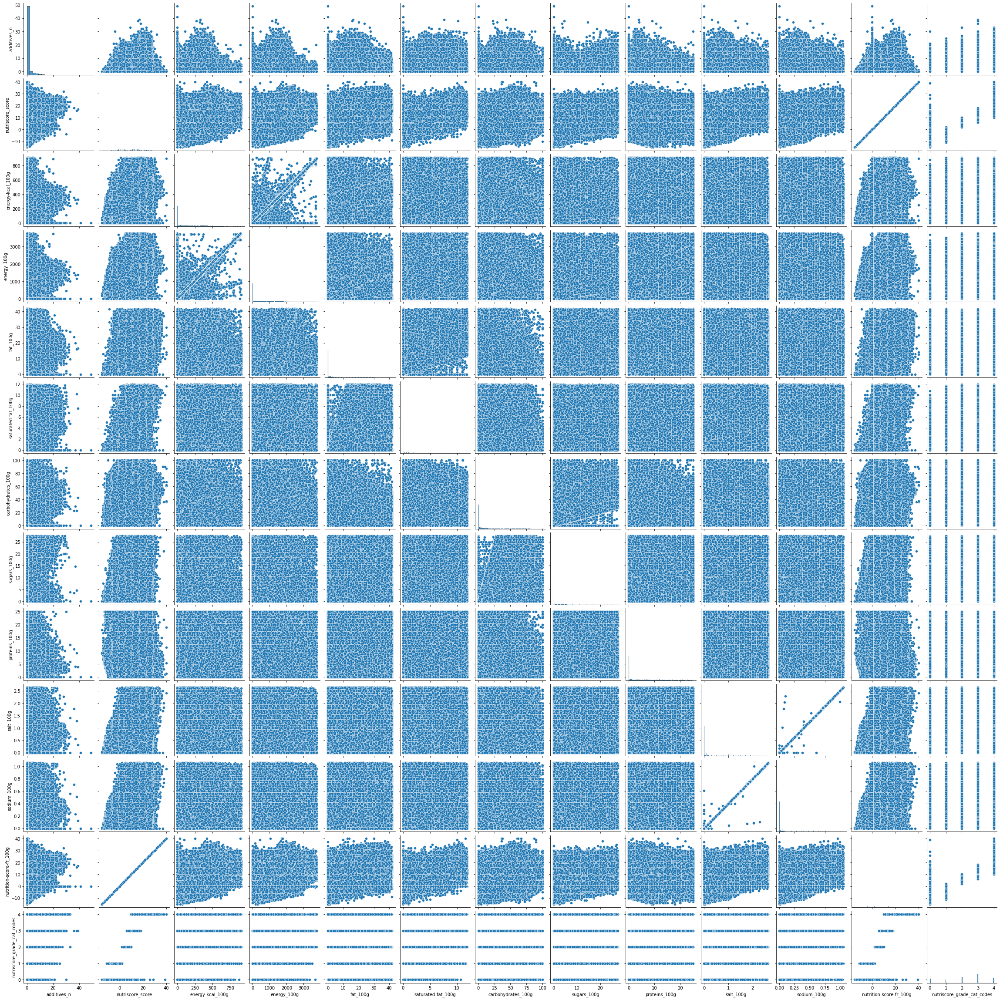

In [53]:
sns.pairplot(df.select_dtypes('float'))

***

## Analysis focused on Qualitative features

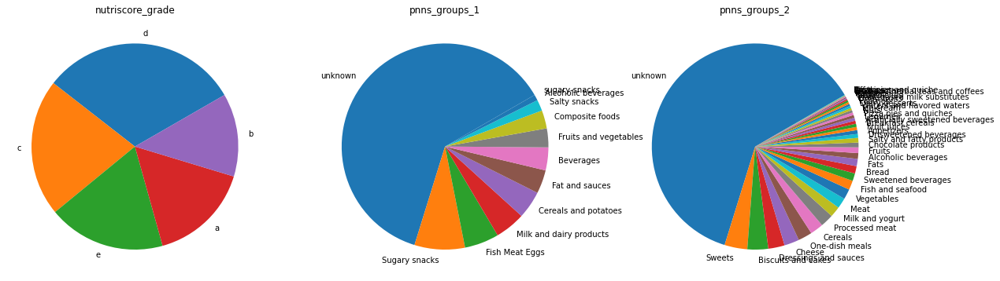

In [13]:
fig, axes = plt.subplots(1, 3, figsize=(20, 15))

for i, col in enumerate(df[['nutriscore_grade', 'pnns_groups_1', 'pnns_groups_2']]):
    ax = axes[i % 3]
    vals = df[col].value_counts(normalize=True)
    ax.pie(vals, labels=vals.index, startangle=30)
    ax.set_title(col)

fig.subplots_adjust(wspace=.2)

Here we can see that `pnns_group1` is mainly filled with 'unknown' values (about 60%)


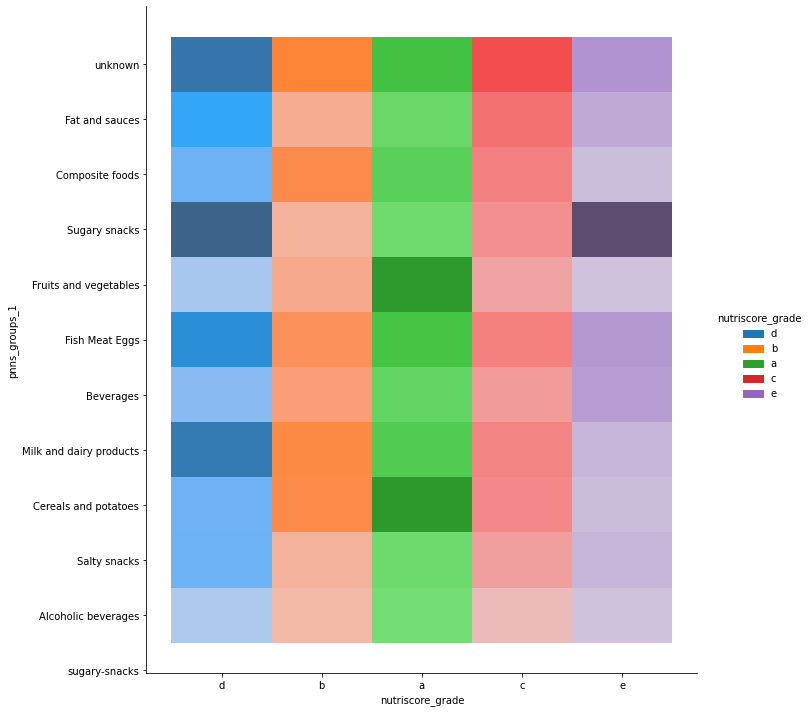

In [14]:
sns.displot(df, y='pnns_groups_1', x='nutriscore_grade', height=10, cmap='viridis', hue='nutriscore_grade')

We can see that for having a healthy meals (cat a), one would prefer to eat fruits, vegetables, cereals and potatoes.
At the opposite, having sugary snack is the worste (cat e) meal.

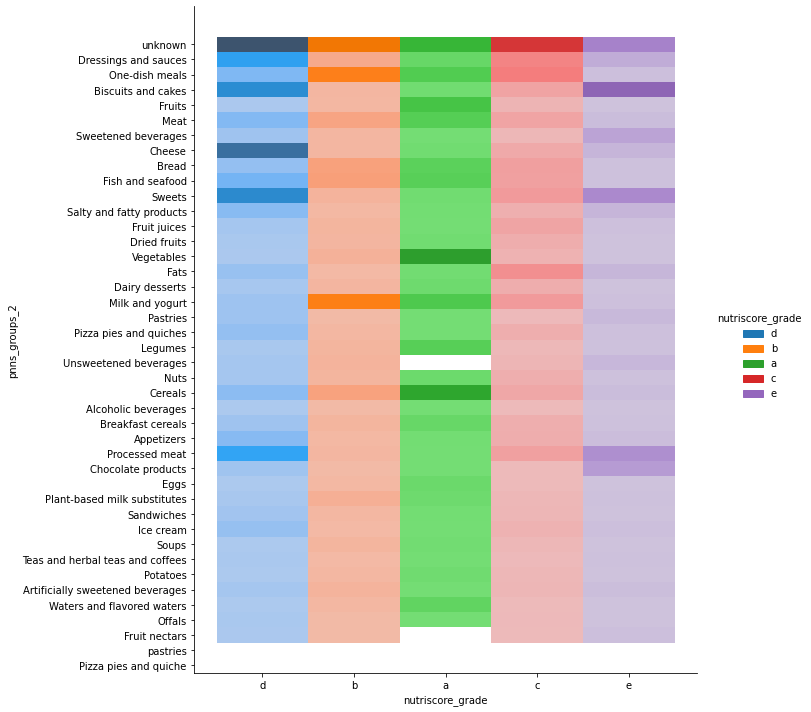

In [15]:
sns.displot(df, y='pnns_groups_2', x='nutriscore_grade', height=10, cmap='viridis', hue='nutriscore_grade')

<Figure size 1440x1440 with 0 Axes>

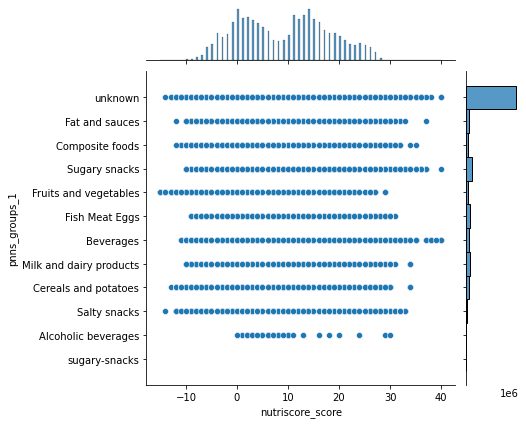

In [16]:
plt.figure(figsize=(20, 20))
sns.jointplot(data=df, x='nutriscore_score', y='pnns_groups_1')

Correlations

In [17]:
pd.crosstab(df['nutriscore_grade'], df['pnns_groups_1'])

pnns_groups_1,Alcoholic beverages,Beverages,Cereals and potatoes,Composite foods,Fat and sauces,Fish Meat Eggs,Fruits and vegetables,Milk and dairy products,Salty snacks,Sugary snacks,unknown
nutriscore_grade,,,,,,,,,,,
a,1,4472,31515,6948,2695,12563,31083,9058,1750,1216,13582
b,1,8780,14229,13802,4166,12321,5237,14663,2427,2595,15439
c,10,9710,15029,16982,21122,17372,7256,16224,8723,12859,29400
d,21,7383,11844,12244,18644,29238,1046,39221,12268,49794,41966
e,11,15097,2211,1574,9704,16569,114,5011,5301,57864,18470


--------------------
FR
(277289, 41)
std         8.692927e+00
skew        1.199459e-02
kurtosis   -8.777998e-01
mean        9.924822e+00
median      1.100000e+01
var         7.556697e+01
mad         7.405893e+00
prod                 inf
sum         2.752044e+06
Name: nutriscore_score, dtype: float64


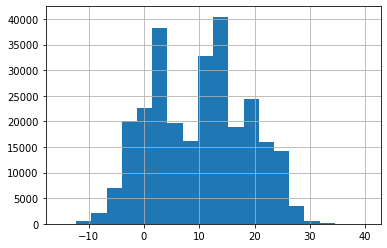

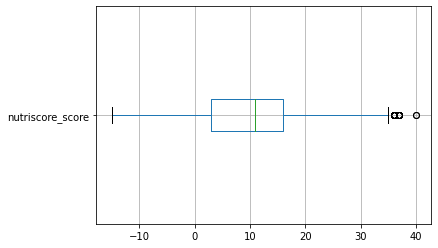

--------------------
US
(226081, 41)
std         9.072824e+00
skew       -1.082389e-01
kurtosis   -9.258780e-01
mean        9.495663e+00
median      1.100000e+01
var         8.231613e+01
mad         7.724602e+00
prod                -inf
sum         2.146789e+06
Name: nutriscore_score, dtype: float64


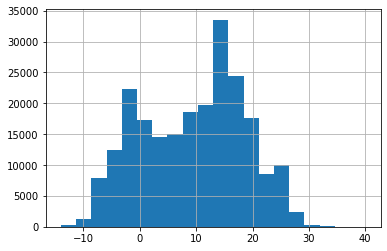

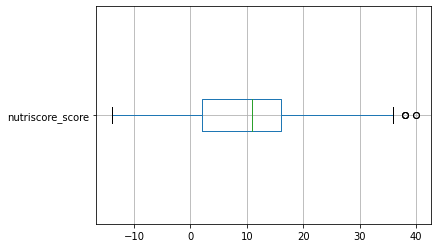

--------------------
ES
(52610, 41)
std         8.387235e+00
skew        1.725937e-01
kurtosis   -8.296991e-01
mean        9.174358e+00
median      9.000000e+00
var         7.034571e+01
mad         7.230973e+00
prod                -inf
sum         4.826630e+05
Name: nutriscore_score, dtype: float64


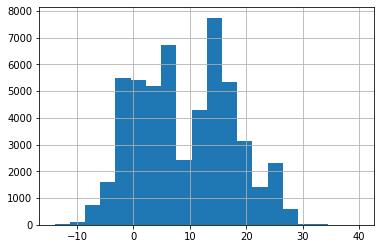

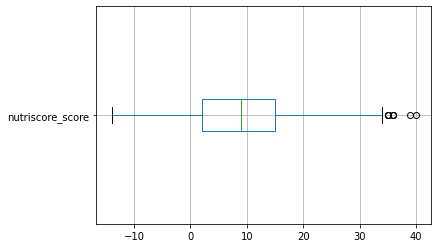

--------------------
IT
(16988, 41)
std         8.460771e+00
skew       -2.604370e-02
kurtosis   -8.645842e-01
mean        9.380504e+00
median      1.100000e+01
var         7.158465e+01
mad         7.227253e+00
prod                 inf
sum         1.593560e+05
Name: nutriscore_score, dtype: float64


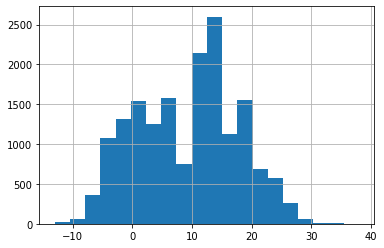

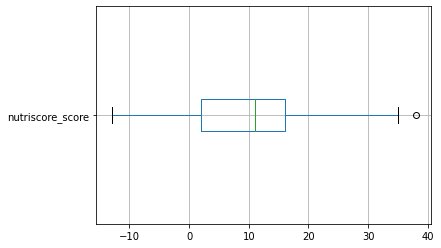

In [54]:
for i, cat in enumerate(['FR', 'US', 'ES', 'IT']):
    subset = df[df.countries_cleaned_cat == cat][df.nutriscore_score != 0].dropna(subset=['nutriscore_score'])
    getStatisticsNutriscore(subset, cat)

<AxesSubplot:xlabel='countries_cleaned', ylabel='Count'>

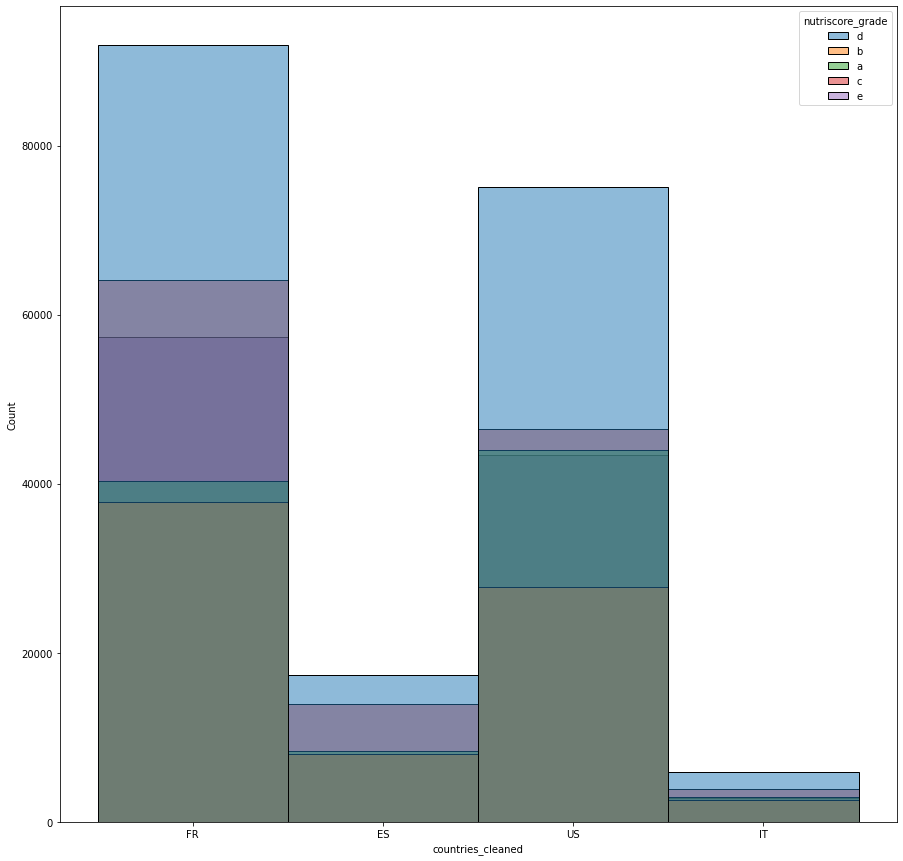

In [62]:
plt.figure(figsize=(15,15))
tmpdf = df.countries_cleaned.isin(['FR', 'US', 'ES', 'IT'])
sns.histplot(df[tmpdf], x='countries_cleaned', hue='nutriscore_grade')

Replace `nutriscore_grade` by a numerical feature, and analyse it

In [20]:
df['nutriscore_grade_cat'] = df['nutriscore_grade'].astype('category')
df['nutriscore_grade_cat'].dropna().cat.categories
df['nutriscore_grade_cat_codes'] = df['nutriscore_grade_cat'].dropna().cat.codes
df['nutriscore_grade_cat'].dropna().cat.codes.unique()

array([3, 1, 0, 2, 4], dtype=int8)

In [21]:
pd.crosstab(df['countries_cleaned_cat'], df['nutriscore_grade'])

nutriscore_grade,a,b,c,d,e
countries_cleaned_cat,,,,,
::,0,1,0,0,0
AD,10,20,18,24,8
AE,16,19,13,16,17
AF,16,22,35,41,24
AH,0,0,1,1,1
...,...,...,...,...,...
美国,0,0,1,0,0
西班,0,0,0,1,0
香港,0,4,1,4,0


Pearson Correlation coefficient is another way to see that these two features are higly correlated

In [22]:
df[['nutriscore_grade_cat_codes', 'nutriscore_score']].corr()

,nutriscore_grade_cat_codes,nutriscore_score
nutriscore_grade_cat_codes,1.000000,0.944612
nutriscore_score,0.944612,1.000000


***

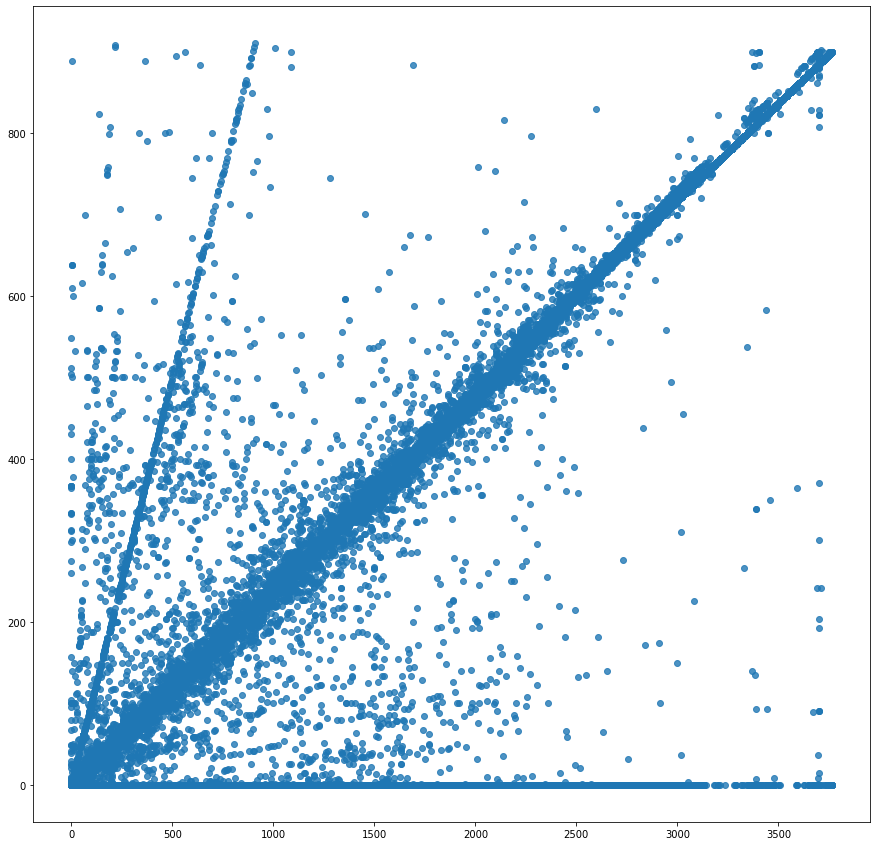

In [61]:
# pd.crosstab(df['nutriscore_score'], df['additives_n'], dropna=True )
plt.figure(figsize=(15,15))
plt.scatter(x=df['energy_100g'], y=df['energy-kcal_100g'], alpha=0.8)

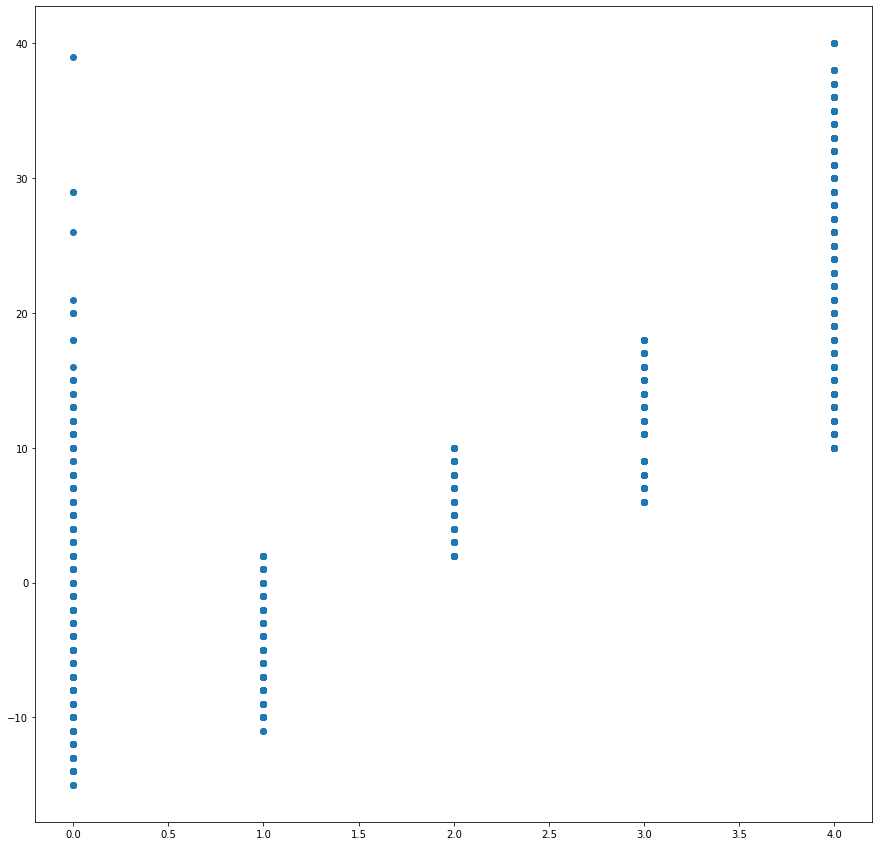

In [60]:
plt.figure(figsize=(15,15))
plt.scatter(x=df['nutriscore_grade'].astype('category').cat.codes, y=df['nutriscore_score'])
# df['nutriscore_grade'].astype('category').cat.codes

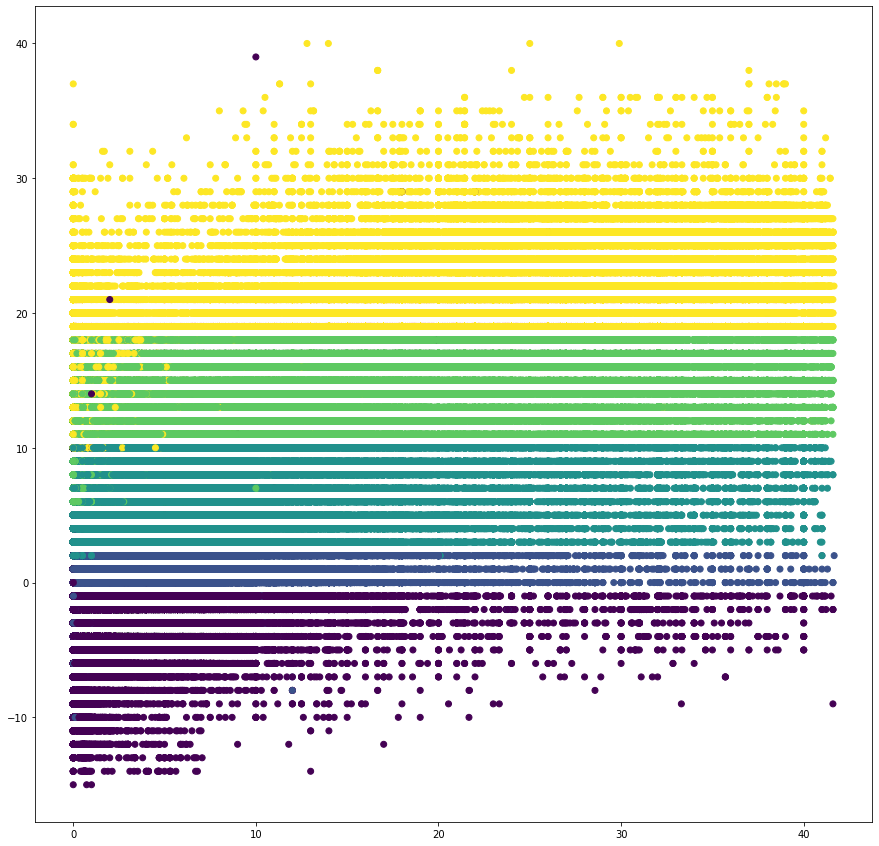

In [55]:
plt.figure(figsize=(15,15))
plt.scatter(x=df['fat_100g'], y=df['nutriscore_score'], c=df['nutriscore_grade'].astype('category').cat.codes)

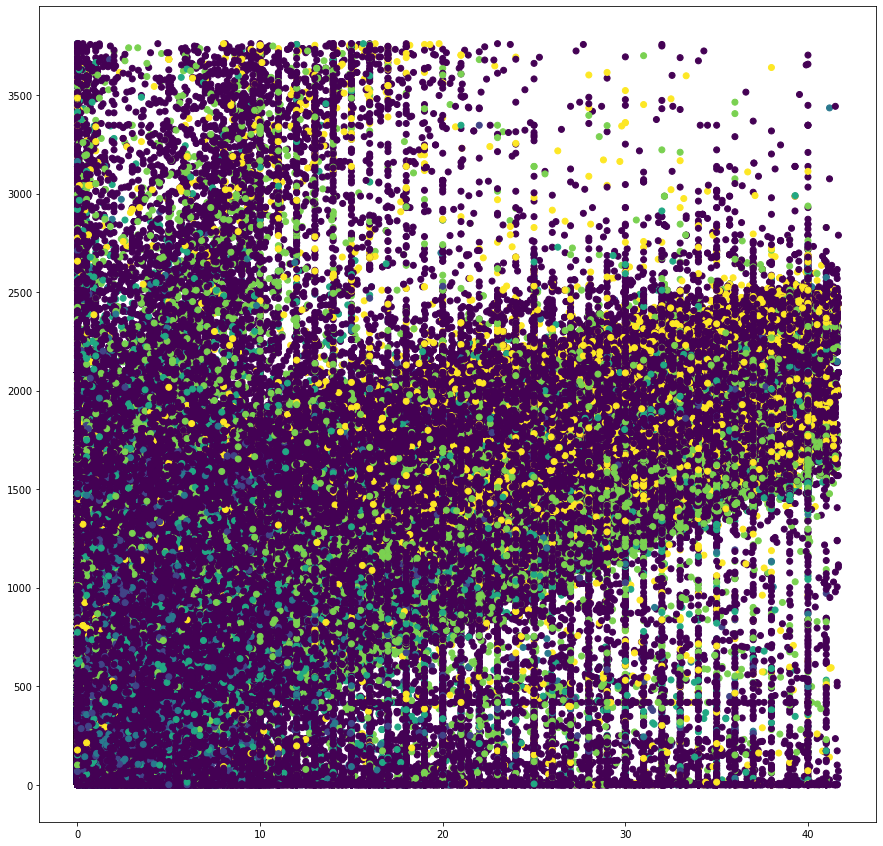

In [56]:
plt.figure(figsize=(15,15))
plt.scatter(x=df['fat_100g'], y=df['energy_100g'], c=df['nutriscore_grade'].astype('category').cat.codes)

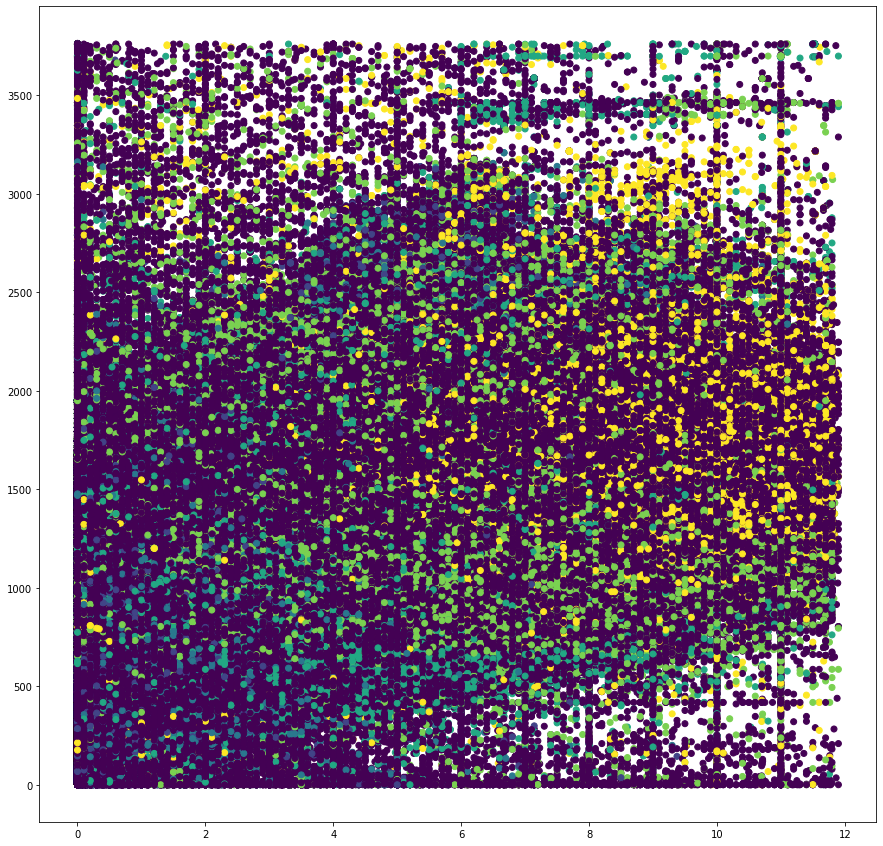

In [57]:
plt.figure(figsize=(15,15))
plt.scatter(x=df['saturated-fat_100g'], y=df['energy_100g'], c=df['nutriscore_grade'].astype('category').cat.codes)

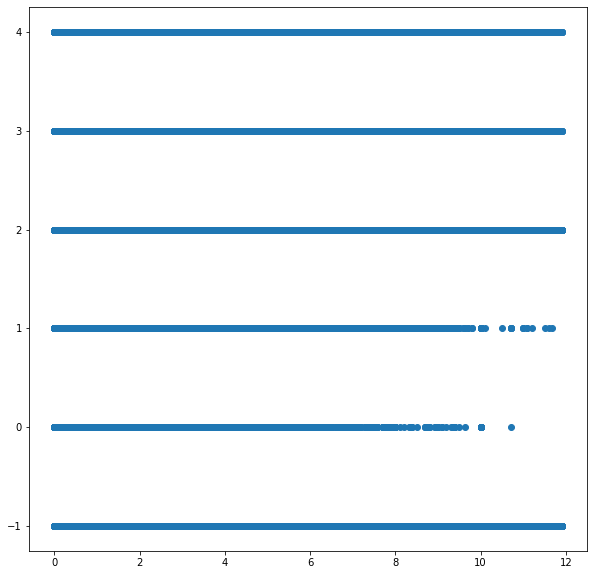

In [28]:
plt.figure(figsize=(10,10))
plt.scatter(x=df['saturated-fat_100g'], y=df['nutriscore_grade'].astype('category').cat.codes)

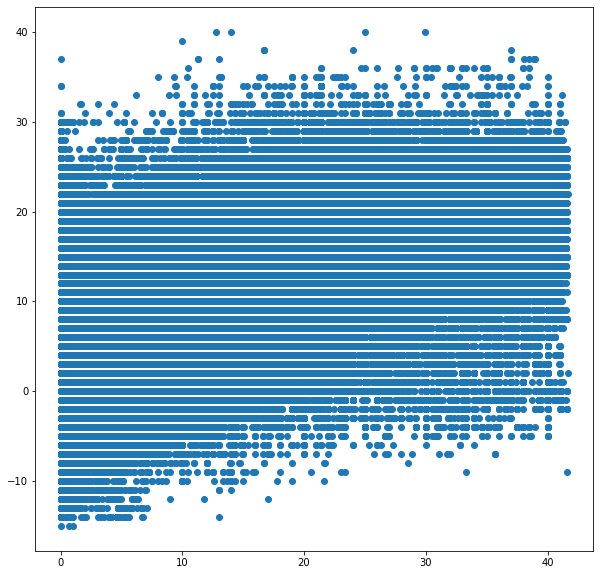

In [29]:
plt.figure(figsize=(10,10))
plt.scatter(x=df['fat_100g'], y=df['nutriscore_score'])

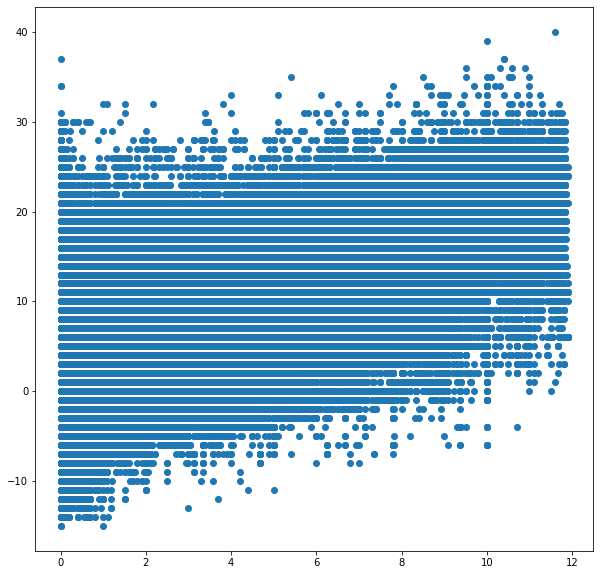

In [30]:
plt.figure(figsize=(10,10))
plt.scatter(x=df['saturated-fat_100g'], y=df['nutriscore_score'])

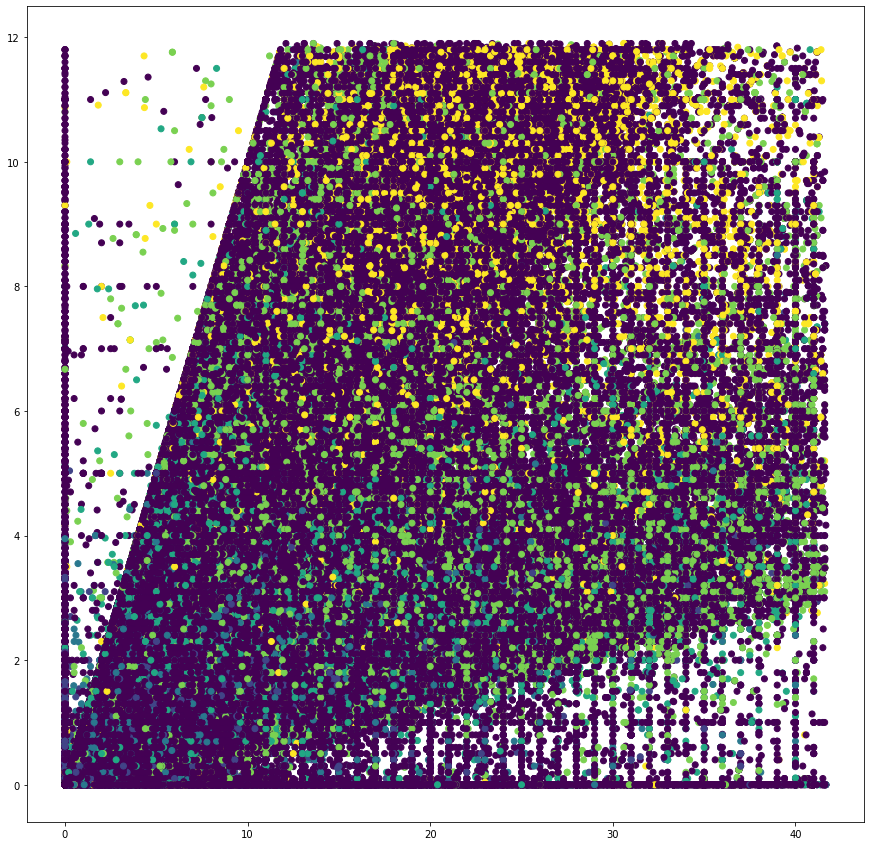

In [58]:
plt.figure(figsize=(15,15))
plt.scatter(x=df['fat_100g'], y=df['saturated-fat_100g'], c=df['nutriscore_grade'].astype('category').cat.codes)

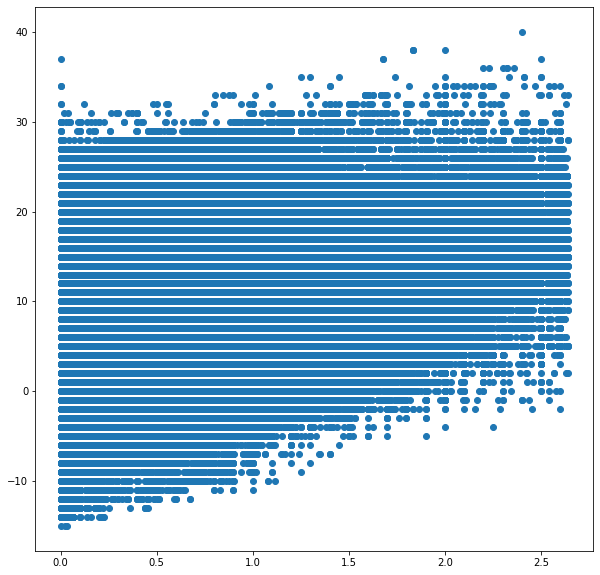

In [32]:
plt.figure(figsize=(10,10))
plt.scatter(x=df['salt_100g'], y=df['nutriscore_score'])

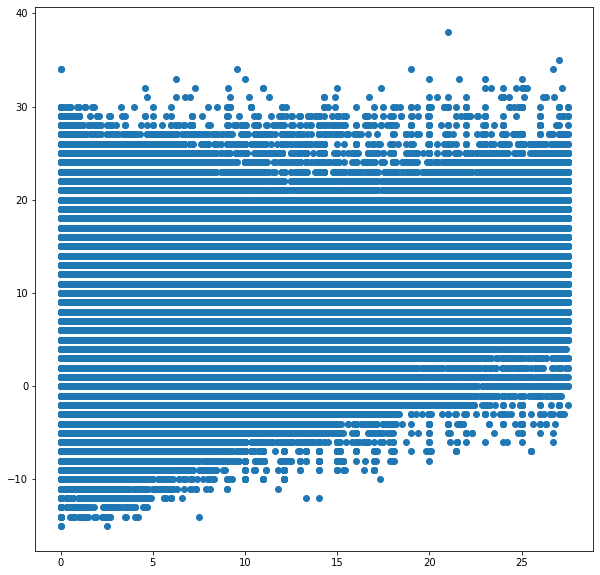

In [33]:
plt.figure(figsize=(10,10))
plt.scatter(x=df['sugars_100g'], y=df['nutriscore_score'])

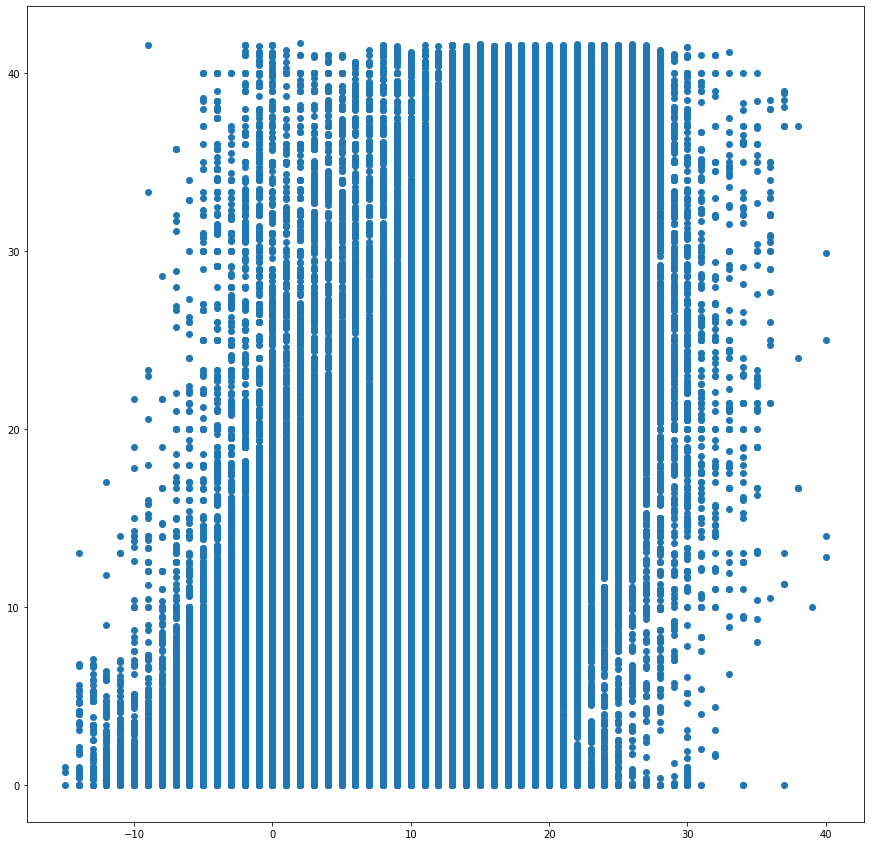

In [59]:

plt.figure(figsize=(15,15))

plt.scatter(x=df['nutriscore_score'], y=df['fat_100g'])

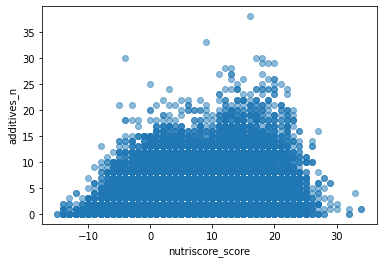

In [36]:
tmp_df = df.dropna()
plt.scatter(tmp_df['nutriscore_score'], tmp_df['additives_n'], alpha=0.5)
plt.xlabel('nutriscore_score')
plt.ylabel('additives_n')
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

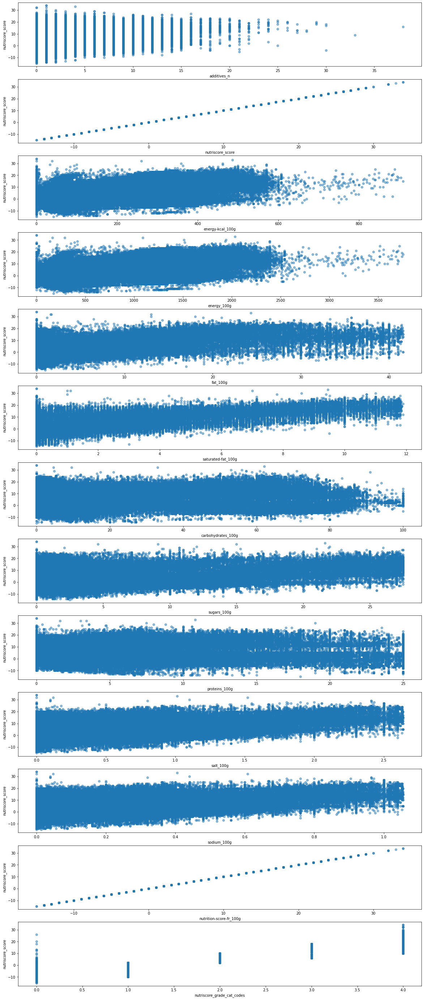

In [37]:
tmp_df = df.dropna()
plt.figure(figsize=(20,50))
size = tmp_df.select_dtypes('float').columns.size
for i, col in enumerate(df.select_dtypes('float')):
    plt.subplot(size, 1, i+1)
    plt.scatter(tmp_df[col], tmp_df['nutriscore_score'], alpha=0.5)
    plt.xlabel(col)
    plt.ylabel('nutriscore_score')
plt.show

# Conclusion

This analysis on the OpenFoodFact dataset showed that it exists a correlation between the nutriscore and the nutriments. A further analysis of regression may results in some good predictions.

The dataset is huge but the data quality is not very good : lots of features are empty, lots of values are Nan or 'unknown'.

